# <center> Лабораторная работа по ЦOC </center>
 <center> <strong> Митрофанов АА </strong> </center> 
 <center> <strong> Вариант 9  </strong> </center> 

# Задание
Выполнить загрузку речевого сигнала и воспроизвести его с разными значениями частот дискретизации. Реализовать процедуру свёртки одномерного сигнала с импульсной характеристикой фильтра. Проверить полученный результат с существующими реализациями свёртки, а также с теоретическим расчётом. Выполнить моделирование процедуры реверберации звукового сигнала с «естественной» импульсным откликом произвольного помещения (Лозаннский собор, Швейцария). Реализовать алгоритм Карплуса–Стронга. В качестве фильтра используем фильтр низких частот с порогом (номер вариант)*100+500

----------------------------------------------------------

# Оглавление:
1. Цель работы
2. Загрузка аудио в python
3. Свертка
4. Теоретический расчет свертки
5. Фильтр низких частот
6. Вывод
    
----------------------------------------------------------

# Цель работы: 
получить основные навыки работы в Python. Изучить существующие библиотеки Python для генерации сигналов и свертки. Изучить свойства свертки.

----------------------------------------------------------

Вариант 9:
Гармонический сигнал, частота которого меняется по закону At^3+Bt^2+Ct+D
A 8
B 1
C 6
D 2
ШАГ 1/1024


# Загрузка аудио в python

Для загрузки аудио в питон удобнее всего использовать библиотеку 
[librosa](https://librosa.org/doc/latest/index.html). Функция librosa.core.load загружает .wav файл, возвращает numpy-массив - оцифрованный звуковой сигнал и частоту дискретизации сигнала. Можно задать частоту дискретизации с помощью аргумента sr, тогда исходный файл передискретизируется в заданное. Передискритезация делается с помощью фильтра [Кайзера](https://en.wikipedia.org/wiki/Kaiser_window)

In [2]:
import numpy as np
import librosa
import scipy
# Библиотеки для отрисовки
import matplotlib.pyplot as plt
import IPython.display as ipd
import librosa.display
%matplotlib inline

In [3]:
# Определим функции для отрисовки
def draw_player(wav, sr):
    player = ipd.Audio(wav, rate=sr)
    ipd.display(player)
    
def draw_waveform(wav, sr, figsize=(14, 5)):
    plt.figure(figsize=figsize)
    librosa.display.waveplot(wav, sr=sr)
    
def draw_sfft(wav, sr, figsize=(14, 5)):
    plt.figure(figsize=figsize)
    X = librosa.stft(wav)
    # X - комплекстная спектрограмма 
    # Для получения энергии достаточно взять модуль
    Xdb = librosa.amplitude_to_db(abs(X))
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
    

In [4]:
#Загружаем с разной частотой дискретизации
srs = [22050, 40000, 8000, 7600, 3800, 3000]
wavs = [librosa.core.load("mitrofanov_lab1.wav", sr=sr)[0] for sr in srs]


In [5]:
print("Примеры Аудио с разными частотами дискретизации ")
for wav, sr in  zip(wavs, srs):
    print(f"Sample rate {sr}")
    draw_player(wav, sr)
  

Примеры Аудио с разными частотами дискретизации 
Sample rate 22050


Sample rate 40000


Sample rate 8000


Sample rate 7600


Sample rate 3800


Sample rate 3000


Форма волны


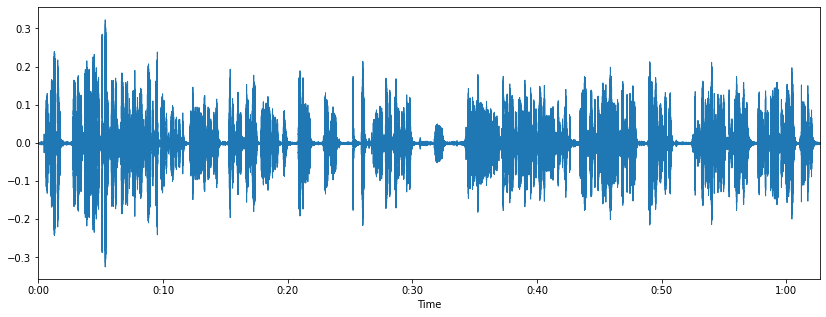

In [6]:
print("Форма волны")
for wav, sr in  zip((wavs[0], ), (srs[0], )):
    draw_waveform(wav, sr)
    plt.show()
 

Спектрограмма


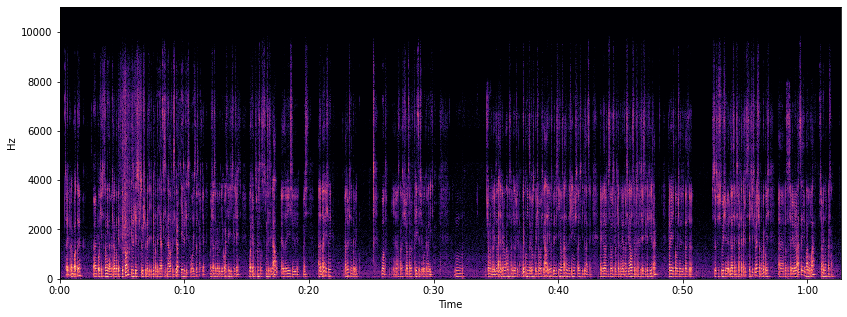

In [7]:
print("Спектрограмма")
for wav, sr in   zip((wavs[0], ), (srs[0], )):
    draw_sfft(wav, sr)
    plt.show()

# Свертка
Реализовать процедуру свёртки одномерного сигнала с импульсной характеристикой фильтра. Проверить полученный результат с существующими реализациями свёртки.

### Теория
Свёртка — это математическая операция, применённая к двум функциям f и g, порождающая третью функцию. Операцию свертки можно интерпретировать как «схожесть» одной функции с отражённой и сдвинутой копией другой.  Другими словами, преобразование свертки однозначно определяет выходной сигнал y(t) для установленного значения входного сигнала x(t) при известном значении функции импульсного отклика системы h(t).

Формула свёртки:
$$y_t=\frac{1}{2} \int_0^T x(\tau)h(t-τ)dτ$$
где $\tau$  - длительность импульсной переходной характеристики.

Свойства свёртки:	
1. Свойство коммутативности или перестановки
$$f*g=g*n$$	
1. Свойство ассоциативности 
$$(f*g)*h=f*(g*h)$$	
1. Свойство дистрибутивности или распределенный закон
$$f*g+f*h=f*(g+h)$$


### Фильтр
Задание: "В качестве фильтра используем фильтр низких частот с порогом (номер вариант)*100+500"
Будем использовать обычный sinc фильтр, без всяких дополнений ( [wiki](https://ru.wikipedia.org/wiki/Sinc-%D1%84%D0%B8%D0%BB%D1%8C%D1%82%D1%80) ). Сделаем его с помощью обратного преобразования фурье


In [8]:
# Будем эксперементировать с оригинальной вавкой
wav, sr = wavs[0], srs[0]

In [9]:
def get_low_pass_filter_spec(freq_thr, N, sr):
    print(f"Max frequency is {freq_thr}")
    #N=len(wav)
    freq_thr_n = N//sr * freq_thr
    print(f"Max frequency is {freq_thr}Hz. N={N}. freq_thr in samples is {freq_thr_n}")
    filter_spec = np.concatenate((np.ones(freq_thr_n) * N, np.zeros(N - freq_thr_n*2), np.ones(freq_thr_n) * N)) 
    return filter_spec

In [68]:
freq_thr=9*100 + 500 + 2000
filter_freq_axis = get_low_pass_filter_spec(freq_thr, len(wav), sr)

Max frequency is 3400
Max frequency is 3400Hz. N=1381797. freq_thr in samples is 210800


Вот так выглядит амплитудный спектр фильтра низких частот


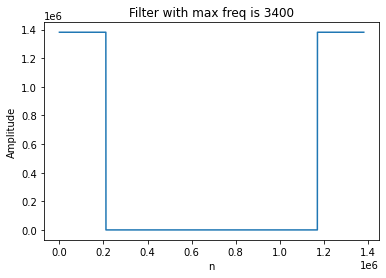

In [69]:
print("Вот так выглядит амплитудный спектр фильтра низких частот")
plt.plot(filter_freq_axis)
plt.title(f"Filter with max freq is {freq_thr}")
plt.ylabel("Amplitude")
plt.xlabel("n")
plt.axis()
plt.show()

In [70]:
# Сконвертим его в 
def convert_spec_to_ir(filter_spec, N):
    filter_ir_splited = scipy.fft.ifft(filter_spec).real # игнорим какую либо фазу
    filter_ir = np.concatenate((filter_ir_splited, filter_ir_splited))[N//2:(3*N//2)] # Центрируем 
    filter_ir = filter_ir / np.max(filter_ir) # нормируем
    return filter_ir
filter_ir = convert_spec_to_ir(filter_freq_axis, len(wav))

In [71]:
np.max(filter_ir)

1.0

Фильтр низких частот в временной области


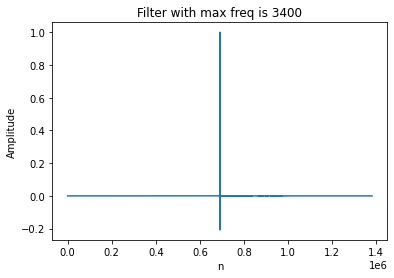

In [72]:
print("Фильтр низких частот в временной области")
plt.plot(filter_ir)
plt.title(f"Filter with max freq is {freq_thr}")
plt.ylabel("Amplitude")
plt.xlabel("n")
plt.show()

Тот же фильт в другом маштабе


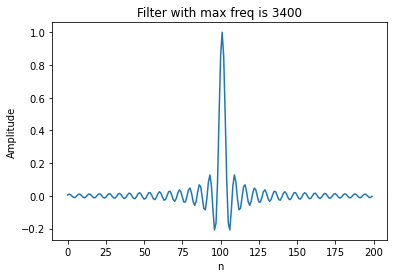

In [73]:
print("Тот же фильт в другом маштабе")
plt.plot(filter_ir[len(wav)//2-100:len(wav)//2+100])
plt.title(f"Filter with max freq is {freq_thr}")
plt.ylabel("Amplitude")
plt.xlabel("n")
plt.show()

# Свертки
### Существующие реализации свертки
В библиотеке [scipy](https://www.scipy.org/) есть готовая реализация свертки [scipy.signal.convolve](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.convolve.html). 

In [74]:
wav_filtered = scipy.signal.convolve(wav, filter_ir, mode='same')

Original
Filtered


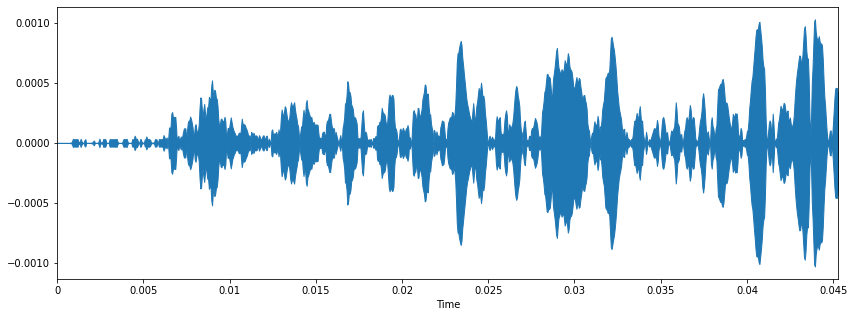

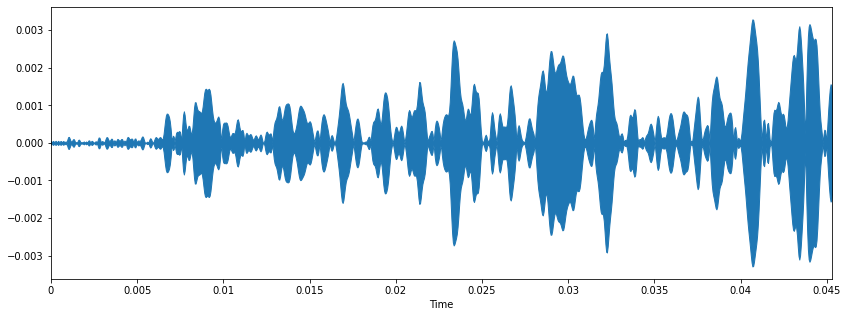

In [75]:
print("Original")
draw_waveform(wav[:1000], sr=sr)
print("Filtered")
draw_player(wav_filtered, sr=sr)
draw_waveform(wav_filtered[:1000], sr=sr)

Как видно из звука были удалены все высокие частоты, что привело к тому что в аудио ничего нельзя разобрать. Это произошло так как 300 Гц до 3400 Гц, а фильт пропускает только частоты ниже 1400Гц.

### Собственная реализация свертки


In [119]:
def convolve(in1, in2):
    N = len(in1)
    in2_center = len(in2)//2
    if N > 1000: 
        print("Warning!. This implementation is very slow. Don't use it for big arrays")
    in1 = np.concatenate((np.zeros(in2_center), in1, np.zeros(in2_center)))
    #print(in1)
    #print(in2)
    #print(in2_center)
    out = []
    for i in range(N):
        start_index = i
        end_index = start_index + len(in2)
        window_in1 = in1[start_index: end_index]
        #print(window_in1)
        a_n = np.dot(window_in1, in2)
        out.append(a_n)
    return np.array(out)

In [120]:
def test_convolve(a, b, print_debug=False):
    my_result = convolve(a, b)
    scipy_result = scipy.signal.convolve(a, b, mode='same', method='direct')
    if print_debug:
        print(f"My result {my_result}")
        print(f"Scipy result {scipy_result}")
    assert (my_result == scipy_result).all(), f"Test {a} conv {b} failed"
    print("Ok!")

In [132]:
a = np.repeat([0,1,0], 10)
b = np.array([0,1,2,3,2,1,0])
test_convolve(a, b, print_debug=False)

Ok!


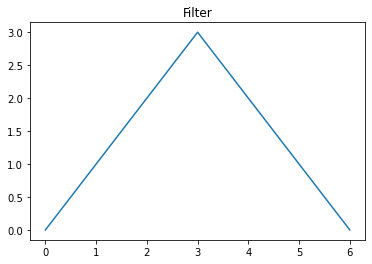

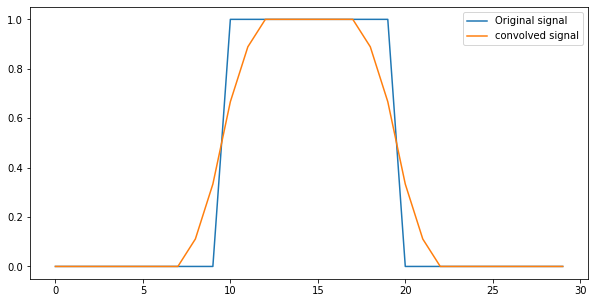

In [138]:
plt.plot(b)
plt.title("Filter")
plt.figure(figsize=(10,5))
plt.plot(a)
conv = convolve(a, b)/sum(b)
plt.plot(conv)
plt.legend(["Original signal", "convolved signal"])
plt.show()

# Алгоритм Карплуса — Стронга 
[wiki](https://en.wikipedia.org/wiki/Karplus%E2%80%93Strong_string_synthesis)


In [179]:
def karplus_strong(noise, N):
    noise_buff = noise.copy()
    gen = np.zeros(N)
    nose_i = 0
    prev_value = 0
    for i in range(N):
        noise_buff[nose_i] = 0.5 * (noise_buff[nose_i] + prev_value)
        gen[i] =  noise_buff[nose_i]
        prev_value = noise_buff[nose_i]
        nose_i += 1
        nose_i = nose_i % len(noise_buff)
    return gen, noise_buff

In [213]:
fs = 10000
noise_size = fs //100
gen_len = 4000
noise = (2 * np.random.randint(0, 2, noise_size) - 1).astype(np.float) # [-1, 1]
gen_wav, reccurent = karplus_strong(noise, gen_len)

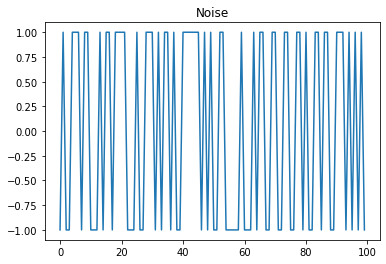

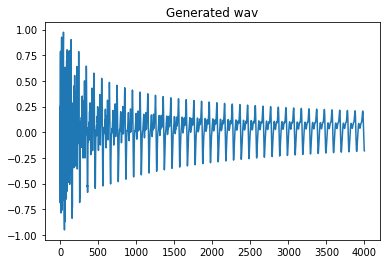

In [214]:
plt.plot(noise)
plt.title("Noise")
plt.show()
plt.plot(gen_wav)
plt.title("Generated wav")
plt.show()
draw_player(sample1, sr=fs)


In [203]:
gen_wav.shape

(4000,)